In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from geopy.distance import great_circle

import folium
from folium import plugins
from string import Template 

import statistics

import warnings
warnings.filterwarnings('ignore')

In [ ]:
data = pd.read_csv("events.csv")

In [ ]:
data.head()

,date,latitude,longitude,event-type,city,county,state
0,2003/01/01 05:00,26.33,-81.14,FLOOD,UNKNOWN,HILLSBOROUGH,FL
1,2003/01/01 05:00,27.22,-81.13,FLOOD,UNKNOWN,MANATEE,FL
2,2003/01/01 08:00,45.28,-120.12,FLOOD,UNKNOWN,SOUTH CENTRAL OREGON COAST,OR
3,2003/01/01 14:15,38.54,-86.03,FLOOD,UNKNOWN,JACKSON,IN
4,2003/01/01 18:00,38.59,-85.38,FLOOD,UNKNOWN,JEFFERSON,IN


In [ ]:
data.shape

(370251, 7)

In [ ]:
print("Missing values:\n", data.isnull().sum())

Missing values:
 date            0
latitude        0
longitude       0
event-type      0
city            4
county        538
state           0
dtype: int64


In [ ]:
data[data["county"].isna()]

,date,latitude,longitude,event-type,city,county,state
12649,2005/06/20 21:20,64.45,-146.90,HEAVY RAIN,2 NW HARDING/BIRCH LAKE,NaN,AK
12959,2005/07/05 00:15,64.92,-147.88,HEAVY RAIN,6 NE ESTER,NaN,AK
13387,2005/07/25 05:30,64.34,-158.69,HEAVY RAIN,KALTAG,NaN,AK
13388,2005/07/25 05:30,64.34,-158.69,HEAVY RAIN,KALTAG,NaN,AK
15352,2005/11/22 21:20,57.05,-135.34,HEAVY RAIN,SITKA,NaN,AK
...,...,...,...,...,...,...,...
333660,2021/08/13 18:41,58.30,-134.42,FLOOD,JUNEAU,NaN,AK
333666,2021/08/13 20:41,58.37,-134.37,FLOOD,5 NNE JUNEAU,NaN,AK
333668,2021/08/13 20:41,58.39,-134.65,FLOOD,AUKE BAY,NaN,AK
333670,2021/08/13 20:41,58.42,-134.55,FLOOD,MENDENHALL GLACIER VISI,NaN,AK


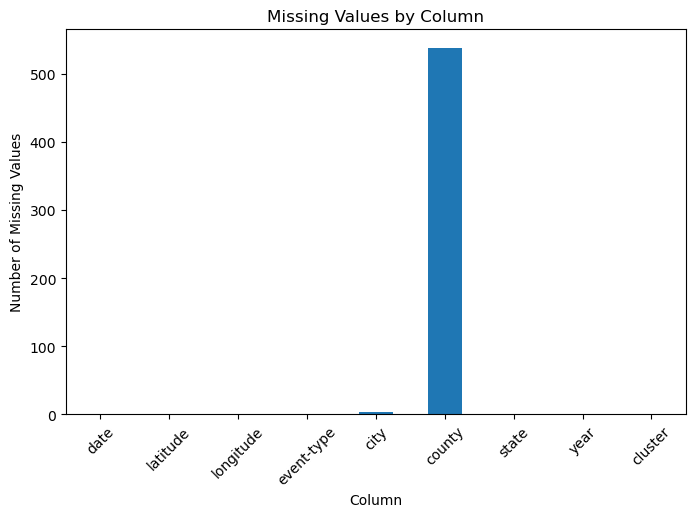

In [ ]:
#Missing Values Analysis
missing_values = data.isnull().sum()

plt.figure(figsize=(8, 5))
missing_values.plot(kind='bar')
plt.title('Missing Values by Column')
plt.xlabel('Column')
plt.ylabel('Number of Missing Values')
plt.xticks(rotation=45)
plt.show()

In [ ]:
data[data["city"].isna()]

,date,latitude,longitude,event-type,city,county,state
24006,2007/06/07 06:44,44.83,-106.62,FLOOD,NaN,SHERIDAN,WY
24038,2007/06/07 15:12,46.26,-105.54,FLOOD,NaN,CUSTER,MT
146235,2015/06/11 02:30,44.82,-106.96,FLOOD,NaN,SHERIDAN,WY
146236,2015/06/11 02:30,44.82,-106.96,FLASH FLOOD,NaN,SHERIDAN,WY


In [ ]:
print("Summary Statistics:\n", data.describe())

Summary Statistics:
             latitude      longitude
count  370251.000000  370251.000000
mean       39.557714     -91.896276
std         4.956872      13.171591
min         1.980000    -171.720000
25%        37.300000     -97.310000
50%        40.100000     -89.780000
75%        42.640000     -84.020000
max        75.000000      73.410000


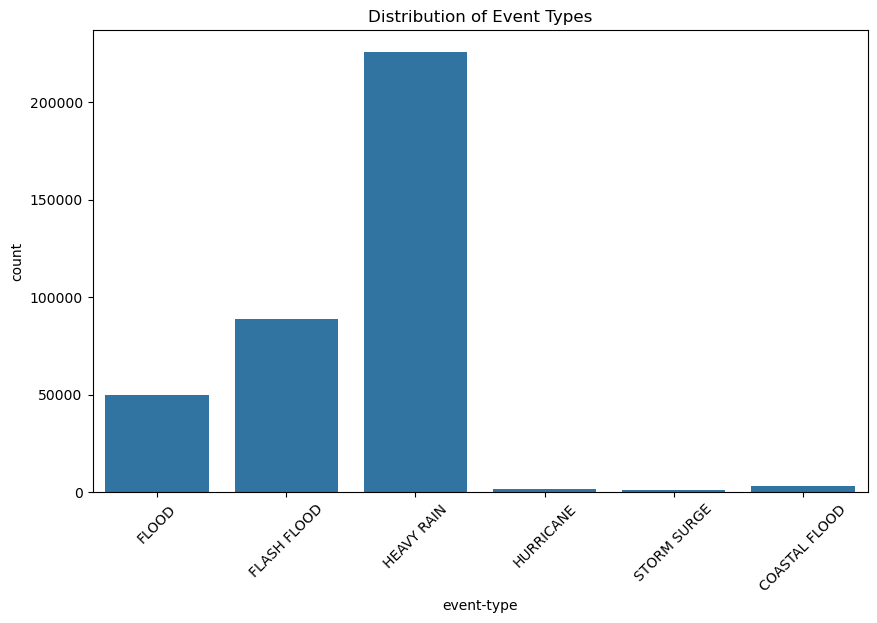

In [ ]:
# event-type distribution
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='event-type')
plt.title('Distribution of Event Types')
plt.xticks(rotation=45)
plt.show()

In [ ]:
#Plot a small sample of the data as it takes too long
plot_df = data.sample(10000)

# Calculate event counts by location
location_counts = plot_df['city'].value_counts().reset_index()
location_counts.columns = ['city', 'count']

# Create a map centered on a specific location (e.g., mean latitude and longitude)
map_center = [plot_df['latitude'].mean(), plot_df['longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=4)

# Add markers for each location with event counts
for idx, row in location_counts.iterrows():
    folium.CircleMarker(
        location=[plot_df.loc[plot_df['city'] == row['city'], 'latitude'].iloc[0],
                  plot_df.loc[plot_df['city'] == row['city'], 'longitude'].iloc[0]],
        radius=row['count'] / 100,  # Adjust the marker size based on event counts
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.5,
        popup=f"{row['city']}: {row['count']} events",
    ).add_to(mymap)

# Display the map within the Jupyter Notebook
mymap

In [ ]:
#Event Counts by Location
location_counts = data['city'].value_counts().nlargest(10)

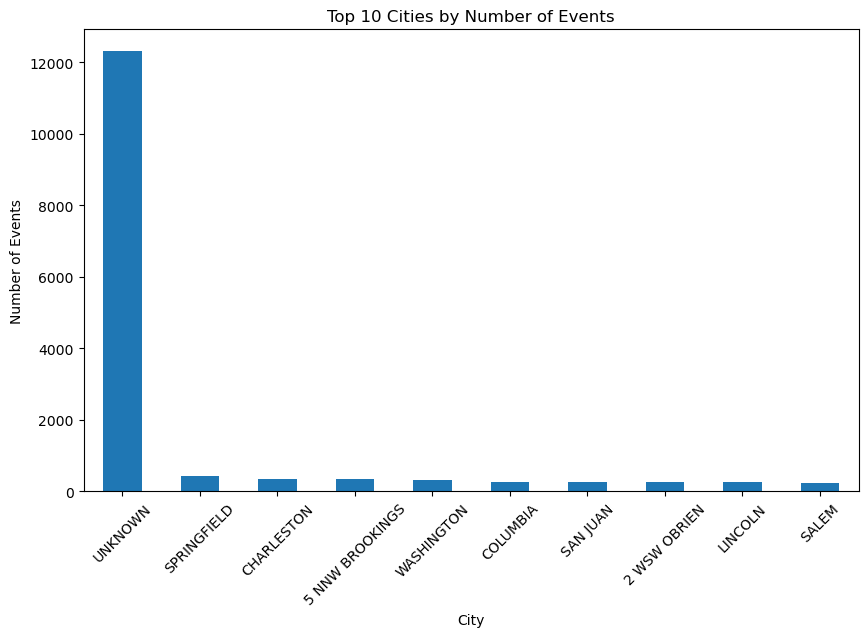

In [ ]:
plt.figure(figsize=(10, 6))
location_counts.plot(kind='bar')
plt.title('Top 10 Cities by Number of Events')
plt.xlabel('City')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.show()

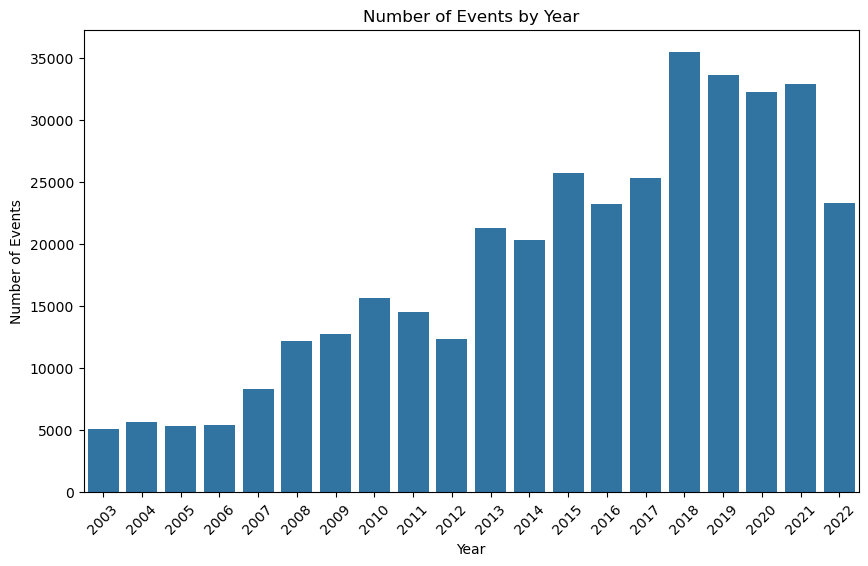

In [ ]:
#Event Counts by Year
data['date'] = pd.to_datetime(data['date'])
data['year'] = data['date'].dt.year
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='year')
plt.title('Number of Events by Year')
plt.xlabel('Year')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.show()

In [ ]:
#Correlation Analysis
correlation_matrix = data[['latitude', 'longitude']].corr()

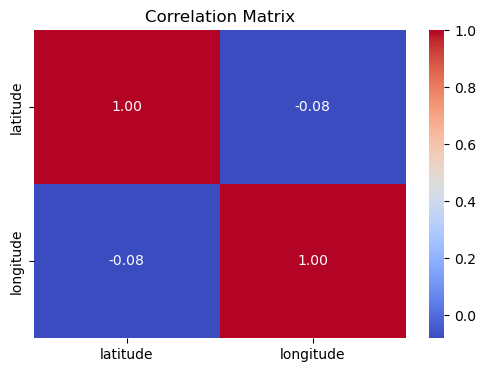

In [ ]:
plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

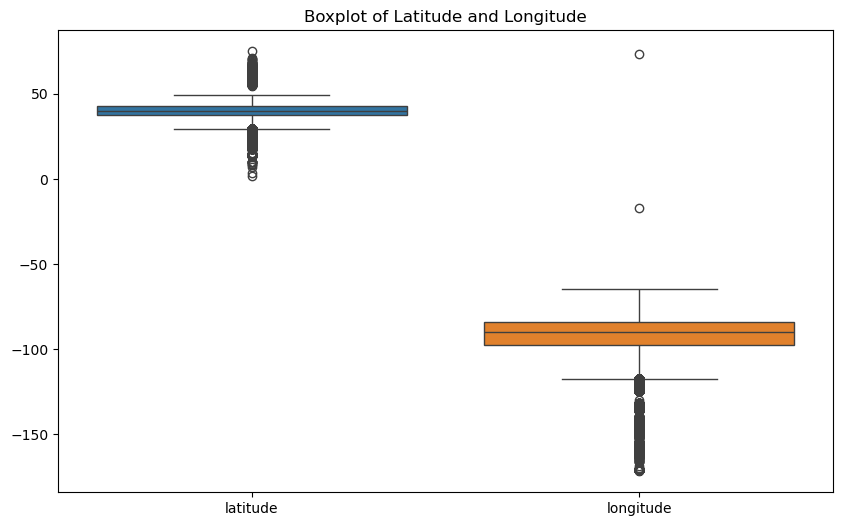

In [ ]:
#Outlier Detection
plt.figure(figsize=(10, 6))
sns.boxplot(data=data[['latitude', 'longitude']])
plt.title('Boxplot of Latitude and Longitude')
plt.show()

### Visualizing different event types

In [ ]:
# Visualize the clusters on a map
map_center = [data['latitude'].mean(), data['longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=4)
kms_per_radian = 6371.0088

def clusters_by_event_type(event_type, color):
    plot_Data = data[data["event-type"]==event_type]
    
    # Extract latitude and longitude
    coords = plot_Data[['latitude', 'longitude']].values
    
    # Perform DBSCAN clustering
    epsilon = 10 / kms_per_radian 
    min_samples = 10 
    dbscan = DBSCAN(eps=epsilon, min_samples=min_samples, metric='euclidean').fit(coords)
    plot_Data['cluster'] = dbscan.labels_

    
    # Add markers for each cluster
    for cluster_id in set(plot_Data['cluster']):
        if cluster_id != -1:  # Exclude noise points (cluster_id=-1)
            cluster_data = plot_Data[plot_Data['cluster'] == cluster_id]
            cluster_center = [cluster_data['latitude'].mean(), cluster_data['longitude'].mean()]
            folium.CircleMarker(
                radius=row['count'] / 100,
                location=cluster_center,
                fill=True,
                color=color,
                fill_color=color
                # popup=f"Cluster {cluster_id}",
                #icon=folium.Icon(color='red')
            ).add_to(mymap)


legend_string_template = Template('&nbsp; $cluster &nbsp; <i class="fa fa-circle" style="color:$color"></i><br>')
legend_string = '''
     <div style="position: fixed; 
         bottom: 50px; right: 50px; width: 200px; height: 150px; 
         border:2px solid grey; z-index:9999; font-size:14px;
    ">
    &nbsp; <strong>LEGEND</strong> <br>'''

event_types = data['event-type'].unique()
colors = ['red', 'blue', 'green', 'purple', 'orange', 'lightgreen']
for event_type, color in zip(event_types, colors):
    clusters_by_event_type(event_type, color)
    legend_string+=legend_string_template.substitute({'cluster':event_type, 'color':color})

legend_string+='</div>'

mymap.get_root().html.add_child(folium.Element(legend_string))

# Display the map with cluster markers
mymap

### High severity zones

In [ ]:
# Create a map centered on a specific location
map_center = [data['latitude'].mean(), data['longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=4)

# Extract latitude and longitude for the event type
coords = data[['latitude', 'longitude']].values

# Perform DBSCAN clustering
epsilon = 10 / kms_per_radian  
min_samples = 10 
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples, metric='euclidean').fit(coords)
data['cluster'] = dbscan.labels_

# Calculate severity based on the number of points in each cluster
cluster_counts = data['cluster'].value_counts()
scaler = StandardScaler()
severity_scores = scaler.fit_transform(cluster_counts.values.reshape(-1, 1)).flatten()

#find median severity
median_severity = statistics.median(severity_scores)

# Add markers for each cluster with color representing severity
for cluster_id, severity in zip(cluster_counts.index, severity_scores):
    if severity>median_severity: # low severity
        if cluster_id != -1:  # Exclude noise points (cluster_id=-1)
            cluster_data = data[data['cluster'] == cluster_id]
            cluster_center = [cluster_data['latitude'].mean(), cluster_data['longitude'].mean()]
            
            # Add circle marker with severity-based color
            folium.CircleMarker(
                location=cluster_center,
                fill=True,
                color = 'red',
                fill_color='red',
                radius=1  # Adjust marker size as needed
            ).add_to(mymap)

mymap

#### Find number of events around a location

In [ ]:
# Script to calculate total events within 50 KM of a point
def count_events_within_radius(latitude, longitude, radius_km=50):
    total_events = 0
    for idx, row in data.iterrows():
        event_coords = (row['latitude'], row['longitude'])
        distance = great_circle((latitude, longitude), event_coords).kilometers
        if distance <= radius_km:
            total_events += 1
    return total_events

In [ ]:
point_latitude = 40.7128
point_longitude = -74.0060
# radius_km = 50
total_events_nearby = count_events_within_radius(point_latitude, point_longitude)
print("Total events within 50 KM of the point:", total_events_nearby)

Total events within 50 KM of the point: 2361


### Observations

- The events are for USA between the years of 2003 and 2022.
- Heavy Rain is the most recurring with more than 200,000 event in almost 2 decades.
- 2018 recorded the highest number of events, closely followed by 2019, 2021 and 2020